![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F518134%2F485aa04e87e4e45c91815101784c6d95%2Fcorona-4930541_1280.jpg?generation=1585438527494582&alt=media)

# COVID-19: current situation in September

## Table of Contents


**[Load Data](#id_load)**<br/>
**[Worldwide trend](#id_ww)**<br/>
**[Country-wise growth](#id_country)**<br/>
**[Going into province](#id_province)**<br/>
**[Zoom up to US: what is happening in US now??](#id_province)**<br/>
**[Europe](#id_europe)**<br/>
**[Asia](#id_asia)**<br/>
**[Which country is recovering now?](#id_recover)**<br/>
**[When will it converge? - Estimation by sigmoid fitting](#id_converge)**<br/>
**[Further reading](#id_ref)**<br/>

In [0]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

# from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
# import plotly.offline as py
# py.init_notebook_mode(connected=True)
# import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

<a id="id_load"></a>
# Load Data

Download latest data from Johns Hopkins University github repository: [https://github.com/CSSEGISandData/COVID-19](https://github.com/CSSEGISandData/COVID-19)

In [0]:
%%time
import requests

for filename in ['time_series_covid19_confirmed_global.csv',
                 'time_series_covid19_deaths_global.csv',
                 'time_series_covid19_recovered_global.csv',
                 'time_series_covid19_confirmed_US.csv',
                 'time_series_covid19_deaths_US.csv']:
    print(f'Downloading {filename}')
    url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/{filename}'
    myfile = requests.get(url)
    open(filename, 'wb').write(myfile.content)

Downloading time_series_covid19_confirmed_global.csv
Downloading time_series_covid19_deaths_global.csv
Downloading time_series_covid19_recovered_global.csv
Downloading time_series_covid19_confirmed_US.csv
Downloading time_series_covid19_deaths_US.csv
CPU times: user 217 ms, sys: 24.4 ms, total: 242 ms
Wall time: 633 ms

In [0]:
from datetime import datetime

def _convert_date_str(df):
    try:
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]
    except:
        print('_convert_date_str failed with %y, try %Y')
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%Y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]


confirmed_global_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
_convert_date_str(confirmed_global_df)

deaths_global_df = pd.read_csv('time_series_covid19_deaths_global.csv')
_convert_date_str(deaths_global_df)

recovered_global_df = pd.read_csv('time_series_covid19_recovered_global.csv')
_convert_date_str(recovered_global_df)

In [0]:
# Filter out problematic data points (The West Bank and Gaza had a negative value, cruise ships were associated with Canada, etc.)
removed_states = "Recovered|Grand Princess|Diamond Princess"
removed_countries = "US|The West Bank and Gaza"

confirmed_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
deaths_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
recovered_global_df = recovered_global_df[~recovered_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
recovered_global_df = recovered_global_df[~recovered_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]

In [0]:
confirmed_global_melt_df = confirmed_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='ConfirmedCases')
deaths_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Deaths')
recovered_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Recovered')

In [0]:
train = confirmed_global_melt_df.merge(deaths_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])

In [0]:
# --- US ---
confirmed_us_df = pd.read_csv('time_series_covid19_confirmed_US.csv')
deaths_us_df = pd.read_csv('time_series_covid19_deaths_US.csv')

confirmed_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key'], inplace=True, axis=1)
deaths_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key', 'Population'], inplace=True, axis=1)

confirmed_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)
deaths_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)

_convert_date_str(confirmed_us_df)
_convert_date_str(deaths_us_df)

# clean
confirmed_us_df = confirmed_us_df[~confirmed_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]
deaths_us_df = deaths_us_df[~deaths_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]

# --- Aggregate by province state ---
#confirmed_us_df.groupby(['Country_Region', 'Province_State'])
confirmed_us_df = confirmed_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()
deaths_us_df = deaths_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()

# remove lat, long.
confirmed_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)
deaths_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)

confirmed_us_melt_df = confirmed_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=confirmed_us_df.columns[2:], var_name='Date', value_name='ConfirmedCases')
deaths_us_melt_df = deaths_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=deaths_us_df.columns[2:], var_name='Date', value_name='Deaths')

train_us = confirmed_us_melt_df.merge(deaths_us_melt_df, on=['Country_Region', 'Province_State', 'Date'])

In [0]:
train = pd.concat([train, train_us], axis=0, sort=False)

train_us.rename({'Country_Region': 'country', 'Province_State': 'province', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities'}, axis=1, inplace=True)
train_us['country_province'] = train_us['country'].fillna('') + '/' + train_us['province'].fillna('')

In [0]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities', 'Recovered': 'recovered'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')

# test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
# test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

<a id="id_ww"></a>
# Worldwide trend

In [0]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df['growth_factor'] = ww_df['new_case'] / ww_df['new_case'].shift(1)
ww_df.tail()

,date,confirmed,fatalities,new_case,growth_factor
274,2020-10-22,37334441,1045406,404845.0,1.073341
275,2020-10-23,37759832,1051492,425391.0,1.050750
276,2020-10-24,38126372,1056608,366540.0,0.861654
277,2020-10-25,38437618,1060046,311246.0,0.849146
278,2020-10-26,38863525,1064862,425907.0,1.368393


In [0]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,544.0
1,2020-01-23,confirmed,631.0
2,2020-01-24,confirmed,908.0
3,2020-01-25,confirmed,1374.0
4,2020-01-26,confirmed,2038.0
...,...,...,...
832,2020-10-22,new_case,404845.0
833,2020-10-23,new_case,425391.0
834,2020-10-24,new_case,366540.0
835,2020-10-25,new_case,311246.0


When we see the confirmed cases in world wide, it just look like exponential growth curve. The number is increasing very rapidly especially recently. **the number almost doubled in last 1 week**...

<span style="color:red"><b>Confirmed cases reached 1M people, and 52K people already died on April 2</b></span>.<br/>
<span style="color:red"><b>Confirmed cases reached 10M people, and 500K people already died on June 28</b></span>.<br/>
<span style="color:red"><b>Confirmed cases reached 20M people, and 750K people already died on Aug 13</b></span>.

<span style="color:red"><b>Daily new confirmed cases started not increasing from April 4. After that flat trend continues so far.</b></span>.

In [0]:
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,544.0
1,2020-01-23,confirmed,631.0
2,2020-01-24,confirmed,908.0
3,2020-01-25,confirmed,1374.0
4,2020-01-26,confirmed,2038.0
...,...,...,...
832,2020-10-22,new_case,404845.0
833,2020-10-23,new_case,425391.0
834,2020-10-24,new_case,366540.0
835,2020-10-25,new_case,311246.0


In [0]:
# import plotly.express as px

In [0]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

Moreover, when we check the growth in log-scale below figure, we can see that the speed of confirmed cases growth rate **slightly increases** when compared with the beginning of March and end of March.<br/>
In spite of the Lockdown policy in Europe or US, the number was increasing rapidly around the beginning of April.

In [0]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

It looks like `fatalities` curve is just shifted the `confirmed` curve to below in log-scale, which means mortality rate is almost constant.

Is it true? Let's see mortality rate in detail.<br/>
We see that mortality rate is kept almost 3%, however it is slightly **increasing gradually to go over 7%** at the end of April.<br/>

Why? I will show you later that Europe & US has more seriously infected by Coronavirus recently, and mortality rate is high in these regions.<br/>
It might be because when too many people get coronavirus, the country cannot provide enough medical treatment.

**It seems mortality rate is start decreasing on May!!** Is it because enough medical care is started to reaching out to everyone or the number of inspection increased and many "hidden" confirmed cases are detected now?

In [0]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

Let's check growth factor:

> Growth factor is the factor by which a quantity multiplies itself over time. The formula used is every day's new cases / new cases on the previous day.

When this number is more than 1. the number of confirmed cases will be increasing, and when it keeps below 1. the number of confirmed cases will decrease.
So it is important to check growth factor is kept below 1. or not.

In worldwide, growth factor is around 1. from May, it means that confirmed cases does not increase, but not decreasing so far...

In [0]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [0]:
ww_df

,date,confirmed,fatalities,new_case,growth_factor
0,2020-01-22,544,17,NaN,NaN
1,2020-01-23,631,18,87.0,NaN
2,2020-01-24,908,25,277.0,3.183908
3,2020-01-25,1374,41,466.0,1.682310
4,2020-01-26,2038,54,664.0,1.424893
...,...,...,...,...,...
274,2020-10-22,37334441,1045406,404845.0,1.073341
275,2020-10-23,37759832,1051492,425391.0,1.050750
276,2020-10-24,38126372,1056608,366540.0,0.861654
277,2020-10-25,38437618,1060046,311246.0,0.849146


In [0]:
fig = px.line(ww_df, x="date", y="growth_factor", 
              title="Worldwide Growth Factor Over Time")
fig.add_trace(go.Scatter(x=[ww_df['date'].min(), ww_df['date'].max()], y=[1., 1.], name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

<a id="id_country"></a>
# Country-wise growth

In [0]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()
country_df.tail()

,date,country,confirmed,fatalities
42495,2020-09-27,Venezuela,72691,606
42496,2020-09-27,West Bank and Gaza,38703,291
42497,2020-09-27,Western Sahara,10,1
42498,2020-09-27,Zambia,14641,332
42499,2020-09-27,Zimbabwe,7812,227


What kind of country is in the dataset? How's the distribution of number of confirmed cases by country?

In [0]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

170 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Canada' 'Central African Republic' 'Chad'
 'Chile' 'China' 'Colombia' 'Comoros' 'Congo (Brazzaville)'
 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Denmark' 'Diamond Princess' 'Djibouti' 'Dominica' 'Dominican Republic'
 'Ecuador' 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'Ghana' 'Greece' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana'
 'Haiti' 'Holy See' 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia'
 'Iran' 'Iraq' 'Ireland' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan'
 'Kenya' 'Korea, South' 'Kosovo' 'Kyrgyzstan' 'Latvia' 'Lebanon' 'Lesotho'
 'Liberia' 'Libya' 'Liechtenstein' 'Lithuania' 'Luxembourg' 'MS Zaandam'
 'Malawi' 'Maldives' 'Mali' 'Malta' 'Mauritania' 'Mexico' 'Moldova'
 'Monaco' 'Mongolia' 'Montenegro' 'Morocco' 'Mozambique' 'Namibia' 'Nepal'
 'Netherlands' 'New Zealand' 'Nicaragua' 'Niger' 'Nigeria'
 'North Macedonia' 'Norway' 'Oman' 'Pakistan' 'Panama' 'Papua New Guinea'
 'Paraguay' 'Peru' 'Poland' 'Portugal' 'Qatar' 'Romania' 'Rwanda'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sao Tome and Principe' 'Saudi Arabia' 'Senegal' 'Serbia'
 'Seychelles' 'Sierra Leone' 'Singapore' 'Slovakia' 'Slovenia' 'Somalia'
 'South Africa' 'Sri Lanka' 'Sudan' 'Suriname' 'Sweden' 'Switzerland'
 'Syria' 'Taiwan*' 'Tajikistan' 'Tanzania' 'Thailand' 'Timor-Leste' 'Togo'
 'Trinidad and Tobago' 'Tunisia' 'Turkey' 'US' 'Uganda' 'Ukraine'
 'United Kingdom' 'Uruguay' 'Uzbekistan' 'Venezuela' 'West Bank and Gaza'
 'Western Sahara' 'Zambia' 'Zimbabwe']

In [0]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date: 2020-09-27
170 countries have more than 1 confirmed cases
168 countries have more than 10 confirmed cases
161 countries have more than 100 confirmed cases
143 countries have more than 1000 confirmed cases
88 countries have more than 10000 confirmed cases

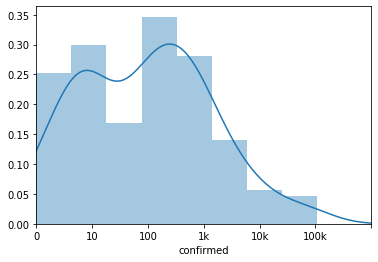

In [0]:
ax = sns.distplot(np.log10(country_df.query('date == "2020-03-27"')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

It is difficult to see all countries so let's check top countries.

In [0]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])


Now **US, Italy and Spain** has more confirmed cases than China, and we can see many Europe countries in the top.

Korea also appears in relatively top despite of its population, this is because Korea execcutes inspection check aggressively.

In [0]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=1500, orientation='h')
fig.show()

Let's check these major country's growth by date.

As we can see, Coronavirus hit **China** at first but its trend is slowing down in March which is good news.<br/>
Bad news is 2nd wave comes to **Europe (Italy, Spain, Germany, France, UK)** at March.<br/>
But more sadly 3rd wave now comes to **US, whose growth rate is much much faster than China, or even Europe**. Its main spread starts from middle of March and its speed is faster than Italy. Now US seems to be in the most serious situation in terms of both total number and spread speed.<br/>

From June, **Branzil & Russia** getting increased.<br/>
From July, **Peru, Chile in South America & India in South Asia** getting increased.

Coronavirus spreads really the "All" over the world, it seems it still need a long time until converge.

You can click country legend to show/hide each country's line plot.
If you cannot see the line (due to plotly bug?) in the plot, you can also try clicking country legend. Line will appear.

In [0]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

In terms of number of fatalities, Europe & US are serious situation now.<br/>
Many countries have more fatalities than China now, including US, Italy, Spain, France, UK, Iran Belgium, Germany, Brazil, Netherlands.

**US's spread speed is the fastest, US's fatality cases become top1 on Apr 10th.**

In June, the number increases rapidly in South America, **Brazil & Mexico**.

In [0]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

Now let's see mortality rate by country

In [0]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)

Italy was the most serious situation, whose mortality rate is over 10% as of 2020/3/28.<br/>
As of June, we can see trend that mortality rate is high in Europe region.<br/>
We can also find countries from all over the world when we see top mortality rate countries.<br/>
Iran/Iraq from Middle East, Phillipines & Indonesia from tropical areas.<br/>
Spain, Netherlands, France, and UK form Europe etc. It shows this coronavirus is really world wide pandemic.

[UPDATE]: According to the comment by @elettra84, 10% of Italy is due to extreme outlier of Lombardy cluster. Except that mortality rate in Italy is comparable to other country. Refer [Lombardy cluster in wikipedia](https://en.wikipedia.org/wiki/2020_coronavirus_pandemic_in_Italy#Lombardy_cluster).

In [0]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

How about the countries whose mortality rate is low?
Many Asian, Middle-East area is on the figure.

By investigating the difference between above & below countries, we might be able to figure out what is the cause which leads death.<br/>
Be careful that there may be a case that these country's mortality rate is low due to these country does not report/measure fatality cases properly.

In [0]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

Let's see number of confirmed cases on map. Again we can see Europe, US, MiddleEast (Turkey, Iran) and Asia (China, Korea) are red.

In [0]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

In [0]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855612> in <module> 
 9 # Please let me know if you know how to do this!! 
 10 trace1 = list ( fig . select_traces ( ) ) [ 0 ] 
 ---> 11 trace1.colorbar = go.choropleth.ColorBar(
 12 tickvals = [ 0 , 1 , 2 , 3 , 4 , 5 ] , 
 13 ticktext=['1', '10', '100', '1000','10000', '10000'])

 NameError : name 'go' is not defined

When we see mortality rate on map, we see Europe (especaiily Italy) is high. Also we notice MiddleEast (Iran, Iraq) is high.

When we see tropical area, I wonder why Phillipines and Indonesia are high while other countries (Malaysia, Thai, Vietnam, as well as Australia) are low.

For Asian region, Korea's mortality rate is lower than China or Japan, I guess this is due to the fact that number of inspection is quite many in Korea.
Please refer these blogs for detail:

 - [South Korea launches 'drive-thru' coronavirus testing facilities as demand soars](https://www.japantimes.co.jp/news/2020/03/01/asia-pacific/science-health-asia-pacific/south-korea-drive-thru-coronavirus/#.XoAmw4j7RPY)
 - [Coronavirus: Why Japan tested so few people](https://asia.nikkei.com/Spotlight/Coronavirus/Coronavirus-Why-Japan-tested-so-few-people)

In [0]:

fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title='Countries with fatalities')
fig.show()

Mortality rate map, seems mortality rate is especially high in Europe region, compared to US or Asia.

In [0]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title='Countries with mortality rate')
fig.show()

Why mortality rate is different among country? What kind of hint is hidden in this map? Especially mortality rate is high in Europe and US, is there some reasons?

![](https://www.researchgate.net/profile/Alice_Zwerling/publication/50892386/figure/fig2/AS:277209752326147@1443103363144/Map-displaying-BCG-vaccination-policy-by-country-A-The-country-currently-has-universal.png)

Reference: [If I were North American/West European/Australian, I will take BCG vaccination now against the novel coronavirus pandemic.](https://www.jsatonotes.com/2020/03/if-i-were-north-americaneuropeanaustral.html)

The figure showing fatality growth since 10 deaths.
 - Ref: [COVID-19 Deaths Per Capita](https://covid19dashboards.com/covid-compare-permillion/)

In [0]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [0]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 28], y=[0, 4], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 56], y=[0, 4], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 84], y=[0, 4], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855620> in <module> 
 2 x = 'date_since_days' , y = 'fatalities_log1p' , color = 'country' , 
 3 title=f'Fatalities by country since 10 deaths, as of {target_date}')
 ----> 4 fig . add_trace ( go . Scatter ( x = [ 0 , 28 ] , y = [ 0 , 4 ] , name = 'Double by 7 days' , line = dict ( dash = 'dash' , color = ( 'rgb(200, 200, 200)' ) ) ) ) 
 5 fig . add_trace ( go . Scatter ( x = [ 0 , 56 ] , y = [ 0 , 4 ] , name = 'Double by 14 days' , line = dict ( dash = 'dash' , color = ( 'rgb(200, 200, 200)' ) ) ) ) 
 6 fig . add_trace ( go . Scatter ( x = [ 0 , 84 ] , y = [ 0 , 4 ] , name = 'Double by 21 days' , line = dict ( dash = 'dash' , color = ( 'rgb(200, 200, 200)' ) ) ) ) 

 NameError : name 'go' is not defined

Sudden increase at China on the days 85 may be because updated reporting in Wuhan:

 - [Coronavirus: China outbreak city Wuhan raises death toll by 50%](https://www.bbc.com/news/world-asia-china-52321529)

## Daily NEW confirmed cases trend

How about **DAILY new cases** trend?<br/>
We find from below figure:
 - China has finished its peak at Feb 14, new confirmed cases are surpressed now.
 - Europe&US spread starts on mid of March, after China slows down.
 - I feel effect of lock down policy in Europe (Italy, Spain, Germany, France) now comes on the figure,
   the number of new cases are not so increasing rapidly at the end of March.
 - Current US new confirmed cases are the worst speed, recording worst speed at more than 30k people/day at peak. <b>Daily new confirmed cases start to decrease from April 4 or April 10, I hope this trend will continue.</b>.
   - <span style="color:red"><b>After that we can see a weekly trend that the confirmed cases becomes small on Monday. I think this is because people don't (or cannot) get medical care on Sunday so its reporting number is low on Sunday or Monday</b></span>
 - From August, India is the top. U.S & Brazil's numbers are start decreasing.

In [0]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country')
fig.show()

In [0]:
country_df['prev_new_case'] = country_df.groupby('country')['new_case'].shift(1)
country_df['growth_factor'] = country_df['new_case'] / country_df['prev_new_case']
country_df['growth_factor'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='growth_factor', color='country',
              title=f'Growth factor by country')
fig.add_trace(go.Scatter(x=[ww_df['date'].min(), ww_df['date'].max()], y=[1., 1.], name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

## Geographical animation: spready by date

You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US.

In [0]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US. But Europe is worse than US for number of fatalities now.

In [0]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

New cases trend: it looks like China is almost converged now.

In [0]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()

<a id="id_province"></a>
# Going into province

How many country has precise province information?<br/>
It seems it's 8 countries: Australia, Canada, China, Denmark, France, Netherlands, US, and UK.

In [0]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces: {province}')

Country Australia has 8 provinces: ['Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia']
Country Canada has 11 provinces: ['Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Northwest Territories' 'Ontario'
 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Yukon']
Country China has 30 provinces: ['Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Henan' 'Hong Kong' 'Hubei' 'Hunan'
 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau' 'Ningxia'
 'Qinghai' 'Shaanxi' 'Shandong' 'Shanxi' 'Sichuan' 'Tianjin' 'Tibet'
 'Xinjiang' 'Zhejiang']
Country Denmark has 3 provinces: ['Faroe Islands' 'Greenland' nan]
Country France has 10 provinces: ['French Guiana' 'French Polynesia' 'Guadeloupe' 'Martinique' 'Mayotte'
 'Reunion' 'Saint Barthelemy' 'Saint Pierre and Miquelon' 'St Martin' nan]
Country Netherlands has 5 provinces: ['Aruba' 'Bonaire, Sint Eustatius and Saba' 'Curacao' 'Sint Maarten' nan]
Country US has 54 provinces: ['Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California' 'Colorado'
 'Connecticut' 'Delaware' 'District of Columbia' 'Florida' 'Georgia'
 'Guam' 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas' 'Kentucky'
 'Louisiana' 'Maine' 'Maryland' 'Massachusetts' 'Michigan' 'Minnesota'
 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada' 'New Hampshire'
 'New Jersey' 'New Mexico' 'New York' 'North Carolina' 'North Dakota'
 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Puerto Rico' 'Rhode Island'
 'South Carolina' 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont'
 'Virgin Islands' 'Virginia' 'Washington' 'West Virginia' 'Wisconsin'
 'Wyoming']
Country United Kingdom has 10 provinces: ['Anguilla' 'Bermuda' 'British Virgin Islands' 'Cayman Islands'
 'Channel Islands' 'Falkland Islands (Malvinas)' 'Gibraltar' 'Isle of Man'
 'Turks and Caicos Islands' nan]

<a id="id_us"></a>
# Zoom up to US: what is happening in US now??

As we can see, the spread is fastest in US now, at the end of March. Let's see in detail what is going on in US.

In [0]:
usa_state_code_df = pd.read_csv('/dbfs/mnt/ADL/Covid19/usa_states2.csv')


In [0]:
train_us

,country,province,date,confirmed,fatalities,country_province
0,US,Alabama,2020-01-22,0,0,US/Alabama
1,US,Alaska,2020-01-22,0,0,US/Alaska
2,US,Arizona,2020-01-22,0,0,US/Arizona
3,US,Arkansas,2020-01-22,0,0,US/Arkansas
4,US,California,2020-01-22,0,0,US/California
...,...,...,...,...,...,...
13495,US,Virginia,2020-09-27,146001,3157,US/Virginia
13496,US,Washington,2020-09-27,86269,2100,US/Washington
13497,US,West Virginia,2020-09-27,15351,339,US/West Virginia
13498,US,Wisconsin,2020-09-27,115862,1281,US/Wisconsin


In [0]:
# Prepare data frame only for US. 

#train_us = train.query('country == "US"')
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

**[Situation in April]**<br/>
When we see inside of the US, **only New York, and its neighbor New Jersey** dominated its spread and are in serious situation around April.<br/>
New York confirmed cases is over 50k, while other states are less than about 5k confirmed cases around April.

**[Situation in July]**<br/>
The high speed coronavirus spread does not decrease in U.S.. Now it affected to many states, especially **California, Texas, Florida**.

In [0]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='confirmed', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Confirmed cases in US on {target_date}')
fig.show()

Mortality rate in New York seems not high, around 2% for now.

In [0]:
train_us_latest.sort_values('confirmed', ascending=False)

,country,province,date,confirmed,fatalities,country_province,mortality_rate,province_code
13450,US,California,2020-09-27,809890,15606,US/California,0.019269,CA
13491,US,Texas,2020-09-27,758756,15745,US/Texas,0.020751,TX
13455,US,Florida,2020-09-27,700564,14032,US/Florida,0.020030,FL
13479,US,New York,2020-09-27,455626,33131,US/New York,0.072715,NY
13456,US,Georgia,2020-09-27,314685,6946,US/Georgia,0.022073,GA
13460,US,Illinois,2020-09-27,290373,8845,US/Illinois,0.030461,IL
13448,US,Arizona,2020-09-27,217237,5623,US/Arizona,0.025884,AZ
13480,US,North Carolina,2020-09-27,207349,3441,US/North Carolina,0.016595,NC
13477,US,New Jersey,2020-09-27,203548,16106,US/New Jersey,0.079126,NJ
13490,US,Tennessee,2020-09-27,192995,2377,US/Tennessee,0.012316,TN


**[Situation in July]**<br/>
The mortality rate is high only around New York & New Jersey, this may be because first wave hit these areas and medical care was not enough in March.

While the mortality rate is relatively low in California, Texas, Florida. These states provides proper medical care?

In [0]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='mortality_rate', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Mortality rate in US on {target_date}')
fig.show()

**Daily growth**: All state is US got affected from middle of March, and now **growing exponentially**.
In New York, less than 1k people are confirmed on March 16, but more than 50k people are confirmed on March 30. **50 times explosion in 2 weeks!**

Now in July, we need to be carefully watch the situation in **California, Texas, Florida**, the number is increasing exponentially in these states now.

In [0]:
train_us_march = train_us.query('date > "2020-03-01"')
fig = px.line(train_us_march,
              x='date', y='confirmed', color='province',
              title=f'Confirmed cases by state in US, as of {target_date}')
fig.show()

In [0]:
train_us_march['prev_confirmed'] = train_us_march.groupby('province')['confirmed'].shift(1)
train_us_march['new_case'] = train_us_march['confirmed'] - train_us_march['prev_confirmed']
train_us_march['new_case'].fillna(0, inplace=True)

fig = px.line(train_us_march,
              x='date', y='new_case', color='province',
              title=f'DAILY NEW Confirmed cases by states in US')
fig.show()

In [0]:
train_us_march['prev_new_case'] = train_us_march.groupby('province')['new_case'].shift(1)
train_us_march['growth_factor'] = train_us_march['new_case'] / train_us_march['prev_new_case']
train_us_march['growth_factor'].fillna(0, inplace=True)
fig = px.line(train_us_march,
              x='date', y='growth_factor', color='province',
              title=f'Growth factor by state in US')
fig.add_trace(go.Scatter(x=[train_us_march['date'].min(), train_us_march['date'].max()], y=[1., 1.],
                         name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855647> in <module> 
 5 x = 'date' , y = 'growth_factor' , color = 'province' , 
 6 title=f'Growth factor by state in US')
 ----> 7 fig.add_trace(go.Scatter(x=[train_us_march['date'].min(), train_us_march['date'].max()], y=[1., 1.],
 8 name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
 9 fig . update_yaxes ( range = [ 0. , 5. ] ) 

 NameError : name 'go' is not defined

<a id="id_europe"></a>
# Europe

In [0]:
# Ref: https://www.kaggle.com/abhinand05/covid-19-digging-a-bit-deeper
europe_country_list =list([
    'Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
    'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
    'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
    'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])

country_df['date'] = pd.to_datetime(country_df['date'])
train_europe = country_df[country_df['country'].isin(europe_country_list)]
#train_europe['date_str'] = pd.to_datetime(train_europe['date'])
train_europe_latest = train_europe.query('date == @target_date')

When we look into the Europe, its Northern & Eastern areas are relatively better situation compared to Eastern & Southern areas.

In [0]:
fig = px.choropleth(train_europe_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, train_europe_latest['confirmed'].max()], 
                    color_continuous_scale='portland', 
                    title=f'European Countries with Confirmed Cases as of {target_date}', scope='europe', height=800)
fig.show()

Especially **Italy, Spain, German, France, UK** are in more serious situation.

Number of confirmed cases rapidly increasing in **Russia now (as of May 1)**, and **Russia** is in much dangerous situation as of July...

In [0]:
train_europe_march = train_europe.query('date >= "2020-03-01"')
fig = px.line(train_europe_march,
              x='date', y='confirmed', color='country',
              title=f'Confirmed cases by country in Europe, as of {target_date}')
fig.show()

**UK's fatality number is growing and becomes top-1 on May 5th, followed by Italy, France and Spain.**

In [0]:
fig = px.line(train_europe_march,
              x='date', y='fatalities', color='country',
              title=f'Fatalities by country in Europe, as of {target_date}')
fig.show()

When we check daily new cases in Europe, we notice:

 - **UK and Russia** daily growth are more than Italy now, These countries are potentially more dangerous now.
 - Italy new cases are not increasing since March 21, I guess due to lock-down policy is started working. That is not a bad news.
 - We can see **big second wave coming to Spain & France from August**.

In [0]:
train_europe_march['prev_confirmed'] = train_europe_march.groupby('country')['confirmed'].shift(1)
train_europe_march['new_case'] = train_europe_march['confirmed'] - train_europe_march['prev_confirmed']
fig = px.line(train_europe_march,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country in Europe')
fig.show()

In [0]:
train_europe_march['prev_new_case'] = train_europe_march.groupby('country')['new_case'].shift(1)
train_europe_march['growth_factor'] = train_europe_march['new_case'] / train_europe_march['prev_new_case']
train_europe_march['growth_factor'].fillna(0, inplace=True)
fig = px.line(train_europe_march,
              x='date', y='growth_factor', color='country',
              title=f'Growth factor by country in Europe')
fig.add_trace(go.Scatter(x=[train_europe_march['date'].min(), train_europe_march['date'].max()], y=[1., 1.],
                         name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855658> in <module> 
 5 x = 'date' , y = 'growth_factor' , color = 'country' , 
 6 title=f'Growth factor by country in Europe')
 ----> 7 fig.add_trace(go.Scatter(x=[train_europe_march['date'].min(), train_europe_march['date'].max()], y=[1., 1.],
 8 name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
 9 fig . update_yaxes ( range = [ 0. , 5. ] ) 

 NameError : name 'go' is not defined

<a id="id_asia"></a>
# Asia

**[April]**<br/>
In Asia, China & Iran have many confirmed cases, followed by South Korea & Turkey. 

**[July]**<br/>

When I notice, coronavirus original place China has relatively few confirmed cases compared to the other seriously affected countries (it might be because China does not report all the confirmed cases).<br/>
**South Asia, including India, Bangladesh, Pakistan, Iran, Saudi Arabia, Turkey** was more affected now.

In [0]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 300000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

The coronavirus hit Asia in early phase, how is the situation now?<br/>
China & Korea is already in decreasing phase.<br/>

Unlike China or Korea, daily new confirmed cases were kept increasing on March or April, especially in Iran or Japan. But the number is started to decrease now on these country as well now.

The number increases exponentially in **India** as of July, need to be careful.

In [0]:
top_asian_country_df = country_df[country_df['country'].isin([
    'China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines',
    'India', 'Bangladesh', 'Pakistan', 'Saudi Arabia', 'Turkey'
])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases Asia')
fig.show()

In [0]:
top_asian_country_df['prev_new_case'] = top_asian_country_df.groupby('country')['new_case'].shift(1)
top_asian_country_df['growth_factor'] = top_asian_country_df['new_case'] / top_asian_country_df['prev_new_case']
top_asian_country_df['growth_factor'].fillna(0, inplace=True)
fig = px.line(top_asian_country_df,
              x='date', y='growth_factor', color='country',
              title=f'Growth factor by country in Asia')
fig.add_trace(go.Scatter(x=[top_asian_country_df['date'].min(), top_asian_country_df['date'].max()], y=[1., 1.],
                         name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
fig.update_yaxes(range=[0., 5.])
fig.show()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855664> in <module> 
 5 x = 'date' , y = 'growth_factor' , color = 'country' , 
 6 title=f'Growth factor by country in Asia')
 ----> 7 fig.add_trace(go.Scatter(x=[top_asian_country_df['date'].min(), top_asian_country_df['date'].max()], y=[1., 1.],
 8 name='Growth factor=1.', line=dict(dash='dash', color=('rgb(255, 0, 0)'))))
 9 fig . update_yaxes ( range = [ 0. , 5. ] ) 

 NameError : name 'go' is not defined

<a id="id_recover"></a>
# Which country is recovering now?

We saw that Coronavirus now hits Europe & US, in serious situation. How does it converge?

We can refer other country where confirmed cases is already decreasing.<br/>
Here I defined `new_case_peak_to_now_ratio`, as a ratio of current new case and the max new case for each country.<br/>
If new confirmed case is biggest now, its ratio is 1.
Its ratio is expected to be low value for the countries where the peak has already finished.

In [0]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [0]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

The ratio is 0 for the country with very few confirmed cases are reported.<br/>
I choosed the countries with its confirmed cases more than 100, to see only major countries with the ratio is low.

We can see:
 - Middle East coutnries.
 - South Africa countries.
 - China & Korea from Asia.

In [0]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

Let's see by map. Yellow countries have high ratio, currently increasing countries. **Blue & purple countries** have low ratio, already decreasing countries from its peak.

[At July 2]: We can see that the number is still increasing in **US, South America, South Asia & Africa**, while we can see converging trend in **Europe & East Asia (around China)**.

In [0]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

In [0]:
china_df.query('(province == "Hubei") & (date > "2020-03-10")')[['country_province', 'date', 'confirmed', 'fatalities', 'recovered', 'new_case']]

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855677> in <module> 
 ----> 1 china_df . query ( '(province == "Hubei") & (date > "2020-03-10")' ) [ [ 'country_province' , 'date' , 'confirmed' , 'fatalities' , 'recovered' , 'new_case' ] ] 

 NameError : name 'china_df' is not defined

<a id="id_converge"></a>
# When will it converge? - Estimation by sigmoid fitting

I guess everyone is wondering when the coronavirus converges. Let's estimate it roughly using sigmoid fitting.<br/>
I referenced below kernels for original ideas.

 - [Sigmoid per country](https://www.kaggle.com/group16/sigmoid-per-country-no-leakage) by @group16
 - [COVID-19 growth rates per country](https://www.kaggle.com/mikestubna/covid-19-growth-rates-per-country) by @mikestubna
 
 
[At July]: Now I am feeling coronavirus does not converge in this year... I expand prediction term until the end of this year.

In [0]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)

    # apply weight, latest number is more important than past.
    weight = np.arange(len(y_pred)) ** 2
    loss_mse = np.mean((y_pred - y) ** 2 * weight)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [0]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.04, 2 * len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2021-01-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [0]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [0]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 8597111.600996874 0.025117339883903925 139.04087922511434
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 5384707.800121885 0.03353986010774264 133.27649185395512
target_country India
train_start_date 2020-03-29 00:00:00 offset 67.0 params 9749471.30550663 0.035777693144738845 168.30246154744995
target_country Mexico
train_start_date 2020-03-30 00:00:00 offset 68.0 params 824669.7170788872 0.032421020058964425 122.08425185604538
target_country United Kingdom
train_start_date 2020-03-11 00:00:00 offset 49.0 params 3757798.2777767833 0.004840604676765864 640.359864526019
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 1577446.020985528 0.003107641003821374 684.0520531293641
target_country Peru
train_start_date 2020-03-31 00:00:00 offset 69.0 params 1284670.2356529916 0.021036725783931044 154.59974678840504
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 17223549.984386247 0.012016337391137069 497.3347587071506
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 555852.6496689947 0.0186642939301314 141.1434131573949
target_country Colombia
train_start_date 2020-04-01 00:00:00 offset 70.0 params 910911.3240183238 0.04662856267267399 136.2994466015728
target_country South Africa
train_start_date 2020-03-27 00:00:00 offset 65.0 params 661939.434256694 0.06922268569016668 111.53237339253373
target_country Argentina
train_start_date 2020-03-31 00:00:00 offset 69.0 params 1255179.773543117 0.03477565812356982 172.53339445447966
target_country Chile
train_start_date 2020-03-25 00:00:00 offset 63.0 params 452115.7552559421 0.03640577721223594 89.31502640629938
target_country Ecuador
train_start_date 2020-03-24 00:00:00 offset 62.0 params 168963.1430578755 0.020858937138069335 127.87141190038585
target_country Indonesia
train_start_date 2020-03-27 00:00:00 offset 65.0 params 980628.3587638775 0.020287801628352312 231.31068855234196
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 2004003.90680943 0.006316866692095878 656.240776773634
target_country Canada
train_start_date 2020-03-21 00:00:00 offset 59.0 params 221174.96708179958 0.009480249720328418 119.54485117182881
target_country Iraq
train_start_date 2020-04-06 00:00:00 offset 75.0 params 502998.3740986299 0.03349882666441362 150.3930272976545
target_country Turkey
train_start_date 2020-03-22 00:00:00 offset 60.0 params 691601.485612206 0.00830535016392059 213.44831720700085
target_country Bolivia
train_start_date 2020-04-27 00:00:00 offset 96.0 params 142445.78329301602 0.04365295605322789 91.15026200229016
target_country Pakistan
train_start_date 2020-03-24 00:00:00 offset 62.0 params 301833.6748485855 0.059366240651041687 84.14249685802264
target_country Netherlands
train_start_date 2020-03-15 00:00:00 offset 53.0 params 3023266.8589655347 0.00869606629586223 585.7613696762137
target_country Sweden
train_start_date 2020-03-15 00:00:00 offset 53.0 params 89085.87176430564 0.035276274809065394 80.31770024334199
target_country Bangladesh
train_start_date 2020-04-14 00:00:00 offset 83.0 params 388275.4392086237 0.033215939986337276 94.87517758453998
target_country Romania
train_start_date 2020-03-26 00:00:00 offset 64.0 params 219843.6162764616 0.02422779387883452 175.60262170254276
target_country China
train_start_date 2020-01-25 00:00:00 offset 3.0 params 338017.5277284394 0.000834484084302829 1482.5503130452917
target_country Saudi Arabia
train_start_date 2020-03-26 00:00:00 offset 64.0 params 335364.2396214525 0.04225984516033128 90.33447098935628
target_country Ukraine
train_start_date 2020-04-03 00:00:00 offset 72.0 params 4063667.445758404 0.018406499236372664 337.3153624577069
target_country Guatemala
train_start_date 2020-05-10 00:00:00 offset 109.0 params 96270.19004944891 0.040868705954632795 82.39232198875989
target_country Poland
train_start_date 2020-03-25 00

In [0]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855683> in <module> 
 ----> 1 plot_sigmoid_fitting ( target_country_df_list , pred_df_list , title = 'Sigmoid fitting with all latest data' ) 

 <command-2984499066855681> in plot_sigmoid_fitting (target_country_df_list, pred_df_list, title) 
 3 
 4 # --- Plot --- 
 ----> 5 fig = go . Figure ( ) 
 6 
 7 for i in range ( n_countries ) : 

 NameError : name 'go' is not defined

If we believe above curve, confirmed cases is slowing down now and it is almost converging in most of the country.<br/>
But it might take until beginning on June in US, and August in Brazil. Thus it still need long-term to converge in world wide. We have a risk of 2nd wave too.

I'm not confident how this sigmoid fitting is accurate, it's just an estimation by some modeling.<br/>
Let's try validation by excluding last 7 days data.

In [0]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=7)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 8537882.181799203 0.025297230325505293 138.42455863969758
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 5299523.991687621 0.03414058076062823 132.16554139662946
target_country India
train_start_date 2020-03-29 00:00:00 offset 67.0 params 9551299.577797083 0.036065235384637274 167.2461138569994
target_country Mexico
train_start_date 2020-03-30 00:00:00 offset 68.0 params 803560.3769975496 0.03343765131135858 120.22807979927612
target_country United Kingdom
train_start_date 2020-03-11 00:00:00 offset 49.0 params 547542.70668792 0.008906654635091323 111.03026650523171
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 512521.74565867765 0.004665901343935116 156.90284867472317
target_country Peru
train_start_date 2020-03-31 00:00:00 offset 69.0 params 1402951.7149638976 0.020131773445182244 162.83102171471444
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 15687539.849948984 0.009782287861075819 566.003831435909
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 520617.6706101188 0.01997917090834781 133.65239303210558
target_country Colombia
train_start_date 2020-04-01 00:00:00 offset 70.0 params 892339.4062924581 0.047660519865099935 135.26254641185494
target_country South Africa
train_start_date 2020-03-27 00:00:00 offset 65.0 params 656793.2914619488 0.07070846478359125 111.23067099602594
target_country Argentina
train_start_date 2020-03-31 00:00:00 offset 69.0 params 1203110.0352147452 0.03531772201654648 170.33781157403587
target_country Chile
train_start_date 2020-03-25 00:00:00 offset 63.0 params 439833.98001341557 0.0392808870775658 87.56209017036662
target_country Ecuador
train_start_date 2020-03-24 00:00:00 offset 62.0 params 158521.25265515165 0.022240403841353458 121.37498013077234
target_country Indonesia
train_start_date 2020-03-27 00:00:00 offset 65.0 params 669514.8152191597 0.021781762925382593 203.5846607391591
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 1113996.7496879112 0.005830977507758867 594.3363944738815
target_country Canada
train_start_date 2020-03-21 00:00:00 offset 59.0 params 162298.37764246203 0.014769220732802615 64.64441276771294
target_country Iraq
train_start_date 2020-04-06 00:00:00 offset 75.0 params 475931.9442649986 0.034546288496856814 147.10577915034156
target_country Turkey
train_start_date 2020-03-22 00:00:00 offset 60.0 params 545046.298149077 0.009469592144648488 162.1566460224572
target_country Bolivia
train_start_date 2020-04-27 00:00:00 offset 96.0 params 141922.51631894335 0.04392372480258522 90.94471517465213
target_country Pakistan
train_start_date 2020-03-24 00:00:00 offset 62.0 params 299436.20829873846 0.061296302649253245 83.83188598884573
target_country Netherlands
train_start_date 2020-03-15 00:00:00 offset 53.0 params 1879355.705538997 0.007378104682611759 599.5410749295256
target_country Sweden
train_start_date 2020-03-15 00:00:00 offset 53.0 params 87653.32053274228 0.03734854717910352 79.47108941972812
target_country Bangladesh
train_start_date 2020-04-14 00:00:00 offset 83.0 params 380767.9675309338 0.0342780355097843 93.49274356724965
target_country Romania
train_start_date 2020-03-26 00:00:00 offset 64.0 params 227387.43269401905 0.02392610524262012 178.12067745850916
target_country China
train_start_date 2020-01-25 00:00:00 offset 3.0 params 149414.9940677153 0.001448641792404534 -16.73034523138891
target_country Saudi Arabia
train_start_date 2020-03-26 00:00:00 offset 64.0 params 333292.99644609494 0.042998397736391046 89.98841890677231
target_country Ukraine
train_start_date 2020-04-03 00:00:00 offset 72.0 params 4150570.6152087376 0.018248541911251706 340.2584526690264
target_country Guatemala
train_start_date 2020-05-10 00:00:00 offset 109.0 params 92992.71674287145 0.04320369846123724 80.41323629747173
target_country Poland
train_start_date 202

In [0]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2984499066855686> in <module> 
 ----> 1 plot_sigmoid_fitting ( target_country_df_list , pred_df_list , title = 'Sigmoid fitting without last 7days data' ) 

 <command-2984499066855681> in plot_sigmoid_fitting (target_country_df_list, pred_df_list, title) 
 3 
 4 # --- Plot --- 
 ----> 5 fig = go . Figure ( ) 
 6 
 7 for i in range ( n_countries ) : 

 NameError : name 'go' is not defined

Now I noticed that sigmoid fitting tend to **underestimate** the curve, and its actual value tend to be more than sigmoid curve estimation.<br/>
Therefore, we need to be careful to see sigmoid curve fitting data, actual situation is likely to be worse than the previous figure trained with all data.